# Import modules

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import math

## for Procrustes analysis
from scipy.spatial import procrustes 

## for principal component analysis
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA 

## for linear discriminant analysis
from sklearn.model_selection import train_test_split
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis 
from sklearn import datasets

## suppress warnings
import warnings
warnings.filterwarnings('ignore')

# Define functions

In [2]:
## define a function to find the angle between 3 points anti-clockwise in degrees, p2 being the vertex
## and p1 being the left hand of the angle and p3 a reference point for directionality
## inputs: three angle points, as tuples
## output: angle in degrees

def AngleBetween(p1, p2, p3):
    x1, y1 = p1
    x2, y2 = p2
    x3, y3 = p3
    deg1 = (360 + math.degrees(math.atan2(x1 - x2, y1 - y2))) % 360
    deg2 = (360 + math.degrees(math.atan2(x3 - x2, y3 - y2))) % 360
    return deg2 - deg1 if deg1 <= deg2 else 360 - (deg1 - deg2)

## define a function to rotate 2D x and y coordinate points around the origin
## inputs: x and y vals (can take pandas dataframe columns) and the degrees (positive, anticlockwise) to rotate
## target_angle is the angle you want to rotate to, in degrees
## outputs: rotated and y vals

def RotatePoints(xvals, yvals, degrees, target_angle):
    
    angle_to_move = target_angle - degrees 
    rads = np.deg2rad(angle_to_move)
    
    new_xvals = xvals*np.cos(rads)-yvals*np.sin(rads)
    new_yvals = xvals*np.sin(rads)+yvals*np.cos(rads)
    
    return new_xvals, new_yvals

## define a function to plot background morphospace
## inputs: scale, determined by checking, to prevent shape overlap in the plot. 
## PC1_pad and PC2_pad, padding on each side of PC to add extra space to see morphospace
## num_intervals, number of intervals to divide each PC axis as a grid
## output: a morphospace plot

def Morphospace(scale, PC1_pad, PC2_pad, num_intervals, PCs):

    ## get PC1 interval values
    PC1_intervals = np.linspace( np.min(PCs[:,0]), np.max(PCs[:,0]) ,num_intervals)

    ## get PC2 interval values
    PC2_intervals = np.linspace( np.min(PCs[:,1]), np.max(PCs[:,1]), num_intervals)

    for i in PC1_intervals:

        for j in PC2_intervals:

            ## perform inverse PCA
            inv_new = pca.inverse_transform(np.array([i,j]))

            ## extract x and y vals, every other
            inv_PC1_vals = inv_new[0::2]
            inv_PC2_vals = inv_new[1::2]

            ## scale so the shapes don't overlap, determine the right scale by checking
            scaled_PC1_vals = inv_PC1_vals*scale
            scaled_PC2_vals = inv_PC2_vals*scale

            ## translate to the PCA point position
            trans_PC1_vals = scaled_PC1_vals + i
            trans_PC2_vals = scaled_PC2_vals + j

            ## plot out the results to make sure it is correct
            plt.fill(trans_PC1_vals, trans_PC2_vals, c="gray", alpha=0.3)
            plt.xlim( (np.min(PCs[:,0])-PC1_pad, np.max(PCs[:,0])+PC1_pad) )
            plt.ylim( (np.min(PCs[:,1])-PC2_pad, np.max(PCs[:,1])+PC2_pad) )
            plt.gca().set_aspect("equal")

# Original and new landmark identities

In order to create a common morphospace between grapevine and maracuyá, a subset of 6 corresponding landmarks, $A$ through $F$, were used. The landmarks correspond to half of the leaf. These common landmarks were reflected to create a whole leaf with 11 new landmarks, $A$ through $K$.

The original numerical landmarks are shown visually below and their corespondence to the new, common landmarks represented by letters is described below for both maracuyá and grapevine.

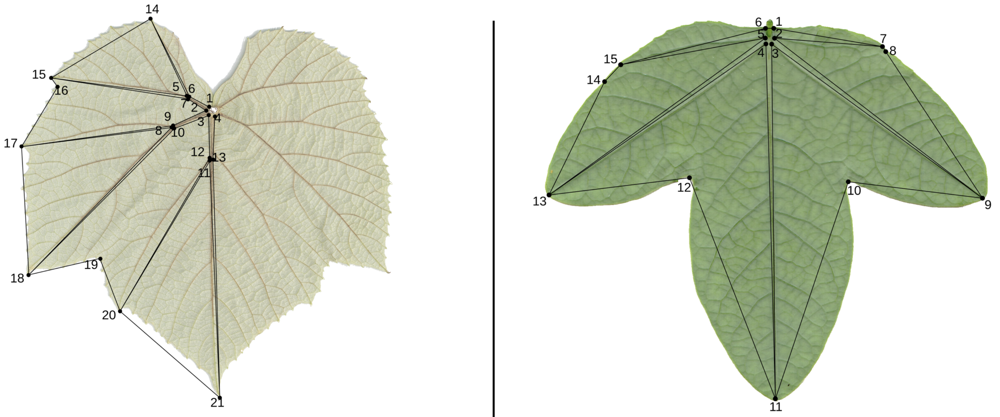

The numerical landmarks we are working from in grapevine (left) and maracuyá (right), from Figure 2 of the pre-print "[Topological data analysis reveals a core heteroblastic program embedded in the leaves of grapevine and maracuyá](https://doi.org/10.1101/2023.07.14.549010)".    

The new landmarks are denoted by letters $A$ through $F$, and correspond to the half of the leaf that is measured. Landmarks $G$ through $K$ represent the reflection.

**Landmark A, petiolar junction:**
- maracuyá, Landmark 1
- grapevine, Landmark 1

**Landmark B, proximal lobe tip:**
- maracuyá, Landmark 7
- grapevine, Landmark 15

**Landmark C, proximal sinus**
- maracuyá, Landmark 8
- grapevine, Landmark 16

**Landmark D, distal lobe tip**
- maracuyá, Landmark 9
- grapevine, Landmark 18

**Landmark E, distal lobe sinus**
- maracuyá, Landmark 10
- grapevine, Landmark 19

**Landmark F, leaf tip**
- maracuyá, Landmark 11
- grapevine, Landmark 21

**Landmark G, reflected distal lobe sinus**  

**Landmark H, reflected distal lobe tip**  

**Landmark I, refleted proximal sinus**  

**Landmark J, reflected proximal lobe tip**  

**Landmark K, reflected petiolar junction**  

# Reassign maracuyá landmark identities

In [3]:
## read in data
maracuyá_data = pd.read_csv("./procrustes_landmarks.csv")

## calculate relative node
maracuyá_data["rel_node"] = maracuyá_data["ontogeny"] / maracuyá_data["total"]

## get landmarks for the right side (when leaf is facing down)
## see Figure 1 at https://doi.org/10.1093/gigascience/giw008 for landmarks
## or, see Figure 2 from the pre-print above
## rename landmarks A-F (base to tip)
right_cols = ["plant","species","x1","y1","x7","y7","x8","y8","x9","y9","x10","y10","x11","y11","rel_node"]
right_side = maracuyá_data.loc[:,right_cols]
right_side.columns = ["plant","species","xA","yA","xB","yB","xC","yC","xD","yD","xE","yE","xF","yF","rel_node"]

## select desired angle to rotate to
desired_ang = 270

## create empty array to store rotated data
maracuya_arr = np.zeros((len(right_side),22))

## for each leaf rotate and then reflect points
## >3000 leaves to process
for i in range(len(right_side)):
    
    ## print every 1000 iterations
    if i%1000==0:
        print(i)

    ## select current leaf
    curr_leaf = right_side.loc[i, :]
    
    ## translate petiolar junction to origin
    curr_leaf["xA"] = curr_leaf["xA"]-curr_leaf["xA"]
    curr_leaf["xB"] = curr_leaf["xB"]-curr_leaf["xA"]
    curr_leaf["xC"] = curr_leaf["xC"]-curr_leaf["xA"]
    curr_leaf["xD"] = curr_leaf["xD"]-curr_leaf["xA"]
    curr_leaf["xE"] = curr_leaf["xE"]-curr_leaf["xA"]
    curr_leaf["xF"] = curr_leaf["xF"]-curr_leaf["xA"]
    
    curr_leaf["yA"] = curr_leaf["yA"]-curr_leaf["yA"]
    curr_leaf["yB"] = curr_leaf["yB"]-curr_leaf["yA"]
    curr_leaf["yC"] = curr_leaf["yC"]-curr_leaf["yA"]
    curr_leaf["yD"] = curr_leaf["yD"]-curr_leaf["yA"]
    curr_leaf["yE"] = curr_leaf["yE"]-curr_leaf["yA"]
    curr_leaf["yF"] = curr_leaf["yF"]-curr_leaf["yA"]

    ## get the angle between the tip and the base of the leaf
    curr_ang = AngleBetween(
        (curr_leaf["xF"],curr_leaf["yF"]),
        (curr_leaf["xA"],curr_leaf["yA"]),
        (curr_leaf["xA"]+1,curr_leaf["yA"]))

    ## rotate points to the desired angle
    new_leaf = RotatePoints(
        np.array(curr_leaf[["xA","xB","xC","xD","xE","xF"]]),
        np.array(curr_leaf[["yA","yB","yC","yD","yE","yF"]]),
        curr_ang,
        desired_ang)

    ## store the rotated points
    maracuya_arr[i,:] = np.array(
        (new_leaf[0][0], new_leaf[1][0],
        new_leaf[0][1], new_leaf[1][1],
        new_leaf[0][2], new_leaf[1][2],
        new_leaf[0][3], new_leaf[1][3],
        new_leaf[0][4], new_leaf[1][4],
        new_leaf[0][5], new_leaf[1][5],
        -new_leaf[0][4], new_leaf[1][4],
        -new_leaf[0][3], new_leaf[1][3],
        -new_leaf[0][2], new_leaf[1][2],
        -new_leaf[0][1], new_leaf[1][1],
        new_leaf[0][0], new_leaf[1][0]
        ))
   
## create a new pandas dataframe from the array
reflect_maracuya = pd.DataFrame({
    "dataset":"maracuya",
    "plant":right_side["plant"],
    "species":right_side["species"],
    "rel_node":right_side["rel_node"],
    "xA":maracuya_arr[:,0],
    "yA":maracuya_arr[:,1],
    "xB":maracuya_arr[:,2],
    "yB":maracuya_arr[:,3],
    "xC":maracuya_arr[:,4],
    "yC":maracuya_arr[:,5],
    "xD":maracuya_arr[:,6],
    "yD":maracuya_arr[:,7],
    "xE":maracuya_arr[:,8],
    "yE":maracuya_arr[:,9],
    "xF":maracuya_arr[:,10],
    "yF":maracuya_arr[:,11],
    "xG":maracuya_arr[:,12],
    "yG":maracuya_arr[:,13],
    "xH":maracuya_arr[:,14],
    "yH":maracuya_arr[:,15],
    "xI":maracuya_arr[:,16],
    "yI":maracuya_arr[:,17],
    "xJ":maracuya_arr[:,18],
    "yJ":maracuya_arr[:,19],
    "xK":maracuya_arr[:,20],
    "yK":maracuya_arr[:,20]})


0
1000
2000
3000


0
1000
2000
3000


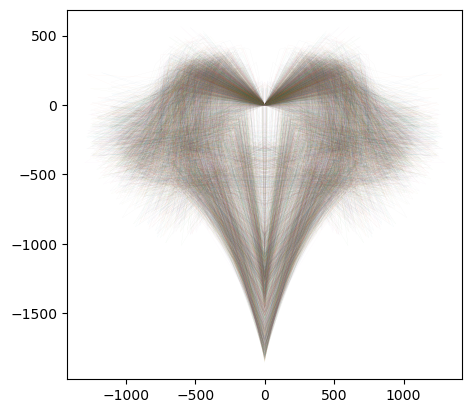

In [4]:
## plot maracuyá leaves to check
for i in range(len(reflect_maracuya)):
    
    if i%1000==0:
        print(i)
    
    curr_xvals = reflect_maracuya.loc[i,["xA","xB","xC","xD","xE","xF","xG","xH","xI","xJ","xK"]]
    curr_yvals = reflect_maracuya.loc[i,["yA","yB","yC","yD","yE","yF","yG","yH","yI","yJ","yK"]]
    
    plt.plot(curr_xvals, curr_yvals, lw=0.1, alpha=0.1)
    plt.gca().set_aspect("equal")
    

# Reassign grapevine landmark identities

In [5]:
## read in grape data
grape_data = pd.read_csv("./grapevine_landmarks.csv")

## grape data
grape_cols = ["vine_year","species","x1","y1","x15","y15","x16","y16","x18","y18","x19","y19","x21","y21","heteroblasty"]
grape_df = grape_data.loc[:,grape_cols]
grape_df.columns = ["plant","species","xA","yA","xB","yB","xC","yC","xD","yD","xE","yE","xF","yF","rel_node"]
grape_df["dataset"] = "grapevine"

## create empty array to store rotated data
grape_arr = np.zeros((len(grape_df),22))

## for each leaf rotate and then reflect points
## >8000 leaves to process
for i in range(len(grape_df)):
    
    ## print every 1000 iterations
    if i%1000==0:
        print(i)

    ## select current leaf
    curr_leaf = grape_df.loc[i, :]
    
    ## translate petiolar junction to origin
    curr_leaf["xA"] = curr_leaf["xA"]-curr_leaf["xA"]
    curr_leaf["xB"] = curr_leaf["xB"]-curr_leaf["xA"]
    curr_leaf["xC"] = curr_leaf["xC"]-curr_leaf["xA"]
    curr_leaf["xD"] = curr_leaf["xD"]-curr_leaf["xA"]
    curr_leaf["xE"] = curr_leaf["xE"]-curr_leaf["xA"]
    curr_leaf["xF"] = curr_leaf["xF"]-curr_leaf["xA"]
    
    curr_leaf["yA"] = curr_leaf["yA"]-curr_leaf["yA"]
    curr_leaf["yB"] = curr_leaf["yB"]-curr_leaf["yA"]
    curr_leaf["yC"] = curr_leaf["yC"]-curr_leaf["yA"]
    curr_leaf["yD"] = curr_leaf["yD"]-curr_leaf["yA"]
    curr_leaf["yE"] = curr_leaf["yE"]-curr_leaf["yA"]
    curr_leaf["yF"] = curr_leaf["yF"]-curr_leaf["yA"]

    ## get the angle between the tip and the base of the leaf
    curr_ang = AngleBetween(
        (curr_leaf["xF"],curr_leaf["yF"]),
        (curr_leaf["xA"],curr_leaf["yA"]),
        (curr_leaf["xA"]+1,curr_leaf["yA"]))

    ## rotate points to the desired angle
    new_leaf = RotatePoints(
        np.array(curr_leaf[["xA","xB","xC","xD","xE","xF"]]),
        np.array(curr_leaf[["yA","yB","yC","yD","yE","yF"]]),
        curr_ang,
        desired_ang)
    
    ## store the rotated points
    grape_arr[i,:] = np.array(
        (new_leaf[0][0], new_leaf[1][0],
        new_leaf[0][1], new_leaf[1][1],
        new_leaf[0][2], new_leaf[1][2],
        new_leaf[0][3], new_leaf[1][3],
        new_leaf[0][4], new_leaf[1][4],
        new_leaf[0][5], new_leaf[1][5],
        -new_leaf[0][4], new_leaf[1][4],
        -new_leaf[0][3], new_leaf[1][3],
        -new_leaf[0][2], new_leaf[1][2],
        -new_leaf[0][1], new_leaf[1][1],
        new_leaf[0][0], new_leaf[1][0]))
   
## create a new pandas dataframe
reflect_grapevine = pd.DataFrame({
    "dataset":"grapevine",
    "plant":grape_df["plant"],
    "species":grape_df["species"],
    "rel_node":grape_df["rel_node"],
    "xA":grape_arr[:,0],
    "yA":grape_arr[:,1],
    "xB":grape_arr[:,2],
    "yB":grape_arr[:,3],
    "xC":grape_arr[:,4],
    "yC":grape_arr[:,5],
    "xD":grape_arr[:,6],
    "yD":grape_arr[:,7],
    "xE":grape_arr[:,8],
    "yE":grape_arr[:,9],
    "xF":grape_arr[:,10],
    "yF":grape_arr[:,11],
    "xG":grape_arr[:,12],
    "yG":grape_arr[:,13],
    "xH":grape_arr[:,14],
    "yH":grape_arr[:,15],
    "xI":grape_arr[:,16],
    "yI":grape_arr[:,17],
    "xJ":grape_arr[:,18],
    "yJ":grape_arr[:,19],
    "xK":grape_arr[:,20],
    "yK":grape_arr[:,21]})



0
1000
2000
3000
4000
5000
6000
7000
8000


0
1000
2000
3000
4000
5000
6000
7000
8000


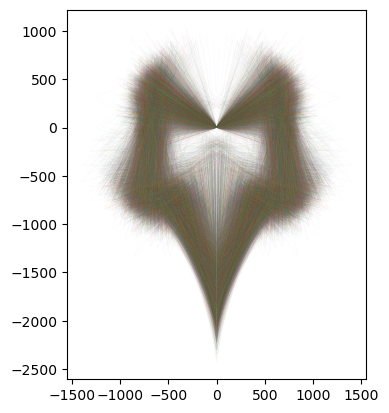

In [6]:
## plot grapevine leaves to check
for i in range(len(reflect_grapevine)):
    
    if i%1000==0:
        print(i)
    
    curr_xvals = reflect_grapevine.loc[i,["xA","xB","xC","xD","xE","xF","xG","xH","xI","xJ","xK"]]
    curr_yvals = reflect_grapevine.loc[i,["yA","yB","yC","yD","yE","yF","yG","yH","yI","yJ","yK"]]
    
    plt.plot(curr_xvals, curr_yvals, lw=0.1, alpha=0.1)
    plt.gca().set_aspect("equal")

# Create combined maracuyá and grapevine dataset

In [7]:
## create a combined df with muracuyá and grapevine data
combined_df = pd.concat([reflect_maracuya, reflect_grapevine], ignore_index=True, axis=0)


In [8]:
## array to store landmark data
combined_arr = np.zeros((len(combined_df),11,2))

## loop over each leaf
## >11,000 leaves
for i in range(len(combined_df)):
    
    if i%1000 == 0:
        print(i)

    ## use .loc to get df data
    ## use np. array to transform into an array
    ## use reshape to reshape the array
    ## place the landmark data into combined_arr
    combined_arr[i,:,:] = np.reshape(np.array(combined_df.loc[i,[
                                            "xA","yA",
                                            "xB","yB",
                                            "xC","yC",
                                            "xD","yD",
                                            "xE","yE",
                                            "xF","yF",
                                            "xG","yG",
                                            "xH","yH",
                                            "xI","yI",
                                            "xJ","yJ",
                                            "xK","yK"]]),
                           (11,2)) ## reshape

0
1000
2000
3000
4000
5000
6000
7000
8000
9000
10000
11000


# Calculate a Generalized Procrustes Analysis mean shape

In [9]:
## select a reference shape
ref_ind = 0 
ref_shape = combined_arr[ref_ind] # select the reference shape

## get number of landmarks from first shape (it's the same for all shapes)
landmark_number = np.shape(combined_arr[0])[0] 

## set a Procrustes distance between means to stop the algorithm, arbitrarily small
mean_diff = 10**(-30) 

## for the first comparison between means, set old_mean to an arbitrary reference shape
old_mean = ref_shape 

## set d, the distance, initially arbitraily high
d = 1000000 

## set boolean criterion for Procrustes distance between mean to stop calculations
while d > mean_diff: 
    
    ## empty 3D array: # samples, total number of landmarks, 2 coord vals
    arr = np.zeros( ((len(combined_arr)),landmark_number,2) ) 

    ## for each leaf shape
    for i in range(len(combined_arr)):  

        ## calculate procrustes adjusted shape to ref for current leaf
        s1, s2, distance = procrustes(old_mean, combined_arr[i]) 
        
        ## store procrustes adjusted shape to array
        arr[i] = s2 

    ## calculate mean of all shapes adjusted to reference
    new_mean = np.mean(arr, axis=(0)) 
    
    ## calculate procrustes distance of new mean to old mean
    s1, s2, d = procrustes(old_mean, new_mean) 
    
    ## print out difference between mean distance
    print("the Procrustes distance between the old and new mean is", d) 
    
    ## set the old_mean to the new_mea before beginning another iteration
    old_mean = new_mean 

## call the resulting mean leaf "gpa_mean"
gpa_mean = new_mean 


the Procrustes distance between the old and new mean is 0.07592602523206247
the Procrustes distance between the old and new mean is 2.2754095262222823e-05
the Procrustes distance between the old and new mean is 8.878738966194216e-09
the Procrustes distance between the old and new mean is 4.1428282862053745e-12
the Procrustes distance between the old and new mean is 2.107267648737334e-15
the Procrustes distance between the old and new mean is 1.122232374770696e-18
the Procrustes distance between the old and new mean is 6.173248941509342e-22
the Procrustes distance between the old and new mean is 3.4818276537283457e-25
the Procrustes distance between the old and new mean is 1.9726561834445656e-28
the Procrustes distance between the old and new mean is 1.3233988838464982e-31


(-0.2978470610578053,
 0.29784706105780545,
 -0.5033346104907647,
 0.24357802372033618)

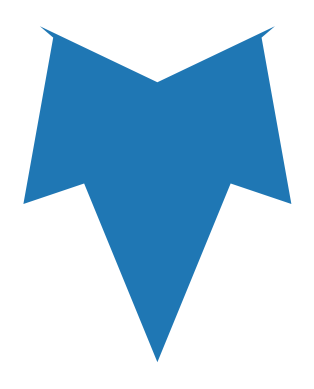

In [10]:
## plot generalized Procrustes mean shape to check
plt.fill(gpa_mean[:,0], gpa_mean[:,1])
plt.gca().set_aspect("equal")
plt.axis("off")

# Align all leaves to Procrustes mean and store superimposed landmarks for analysis

In [11]:
## get number of landmarks from first shape (it's the same for all)
landmark_number = np.shape(combined_arr[0])[0] 

## empty 3D array: # samples, total landmarks, 2 coord vals
proc_arr = np.zeros( ((len(combined_arr)), landmark_number, 2) ) 

## for each leaf shape 
for i in range(len(combined_arr)): 

    ## calculate procrustes adjusted shape to ref for current leaf
    s1, s2, distance = procrustes(gpa_mean, combined_arr[i]) 
    
    ## store procrustes adjusted shape to array
    proc_arr[i] = s2 

(-0.5406003480298329,
 0.5406003480298329,
 -0.7704681566450249,
 0.40067048620707024)

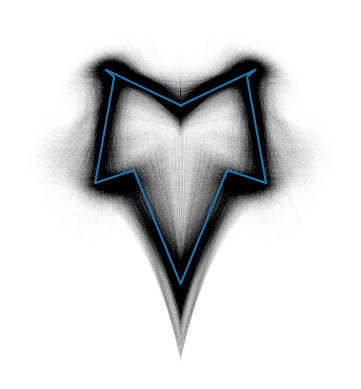

In [12]:
## plot out all Procrustes aligned leaves to check
plot_col = "k" # set plot color
a = 0.002 # set alpha

for i in range(np.shape(proc_arr)[0]):
    
    curr_leaf = proc_arr[i,:,:]
    
    ## plot current leaf with color and alpha
    plt.plot(curr_leaf[:,0], curr_leaf[:,1], c=plot_col, alpha=a, lw=0.5) 
    plt.gca().set_aspect("equal")

## plot the mean leaf
plt.plot(gpa_mean[:,0], gpa_mean[:,1]) 

plt.gca().set_aspect("equal")
plt.axis("off")

# Principal Component Analysis, morphospace, and eigenleaf representations

In [13]:
## define number of desired PCs
## for reconstruction, it's easier to just use 2
## but we can use more PC values if desired

pca = PCA(n_components=2)

## apply the sklearn pca function with desired number of components
## flatten the array of procrustes data

PCs = pca.fit_transform(np.reshape(proc_arr, (11784, 22)))


In [14]:
## reshape the procrustes data to flatten the x and y coordinates
reshaped_proc_arr = np.reshape(proc_arr, (11784, 22))

## create a new dataframe with procrustes data
proc_df = pd.DataFrame({"plant":combined_df["plant"],
                        "species":combined_df["species"],
                        "dataset":combined_df["dataset"],
                        "rel_node":combined_df["rel_node"],
                        "xA":reshaped_proc_arr[:,0],
                        "yA":reshaped_proc_arr[:,1],
                        "xB":reshaped_proc_arr[:,2],
                        "yB":reshaped_proc_arr[:,3],
                        "xC":reshaped_proc_arr[:,4],
                        "yC":reshaped_proc_arr[:,5],
                        "xD":reshaped_proc_arr[:,6],
                        "yD":reshaped_proc_arr[:,7],
                        "xE":reshaped_proc_arr[:,8],
                        "yE":reshaped_proc_arr[:,9],
                        "xF":reshaped_proc_arr[:,10],
                        "yF":reshaped_proc_arr[:,11],
                        "xG":reshaped_proc_arr[:,12],
                        "yG":reshaped_proc_arr[:,13],
                        "xH":reshaped_proc_arr[:,14],
                        "yH":reshaped_proc_arr[:,15],
                        "xI":reshaped_proc_arr[:,16],
                        "yI":reshaped_proc_arr[:,17],
                        "xJ":reshaped_proc_arr[:,18],
                        "yJ":reshaped_proc_arr[:,19],
                        "xK":reshaped_proc_arr[:,20],
                        "yK":reshaped_proc_arr[:,21]
                       
                       })

## grapevine '597293x2017' only has 3 leaves
## and a model can not be fit
## it is removed
proc_df = proc_df[proc_df["plant"]!='597293x2017']

## create a list of unique plant/vine names
plants = proc_df["plant"].unique()

In [15]:
ont_het_list = [] # store if each leaf is ontogeny ("ont") or heteroblasty ("het")

for i in range(len(plants)): # for each plant sampled

    curr_plant = proc_df[proc_df["plant"]==plants[i]] # get all leaves of the current plant

    reset_df = curr_plant.reset_index() # reset the index of the current plant df

    len_reset_df = len(reset_df) # get the number of leaves of current plant

    mean_rel_node = np.mean(reset_df["rel_node"]) # get the mean relative node of current plant

    for j in range(len_reset_df): # for each leaf of the current plant

        current_rel_node = reset_df.iloc[j,:]["rel_node"] # get current rel node 

        if current_rel_node <= mean_rel_node: # if <= mean, then ont

            ont_het_list.append("ont")

        if current_rel_node > mean_rel_node: # if > mean, then het

            ont_het_list.append("het")

proc_df["ont_het"] = ont_het_list # add the ont_het_list to the proc_df

proc_df["interaction"] = proc_df["dataset"] + "_" + proc_df["ont_het"] # add interaction term
# "interaction" is "maracuya_ont", "maracuya_het", "grapevine_ont", or "grapevine_het"


In [16]:
PCA_arr = proc_df.iloc[:,4:26].to_numpy()

## define number of desired PCs
## for reconstruction, it's easier to just use 2
## but we can use more PC values if desired

pca = PCA(n_components=2)

## apply the sklearn pca function with desired number of components
## flatten the array of procrustes data

PCs = pca.fit_transform(PCA_arr)

Text(0, 0.5, 'PC2: 25.623%')

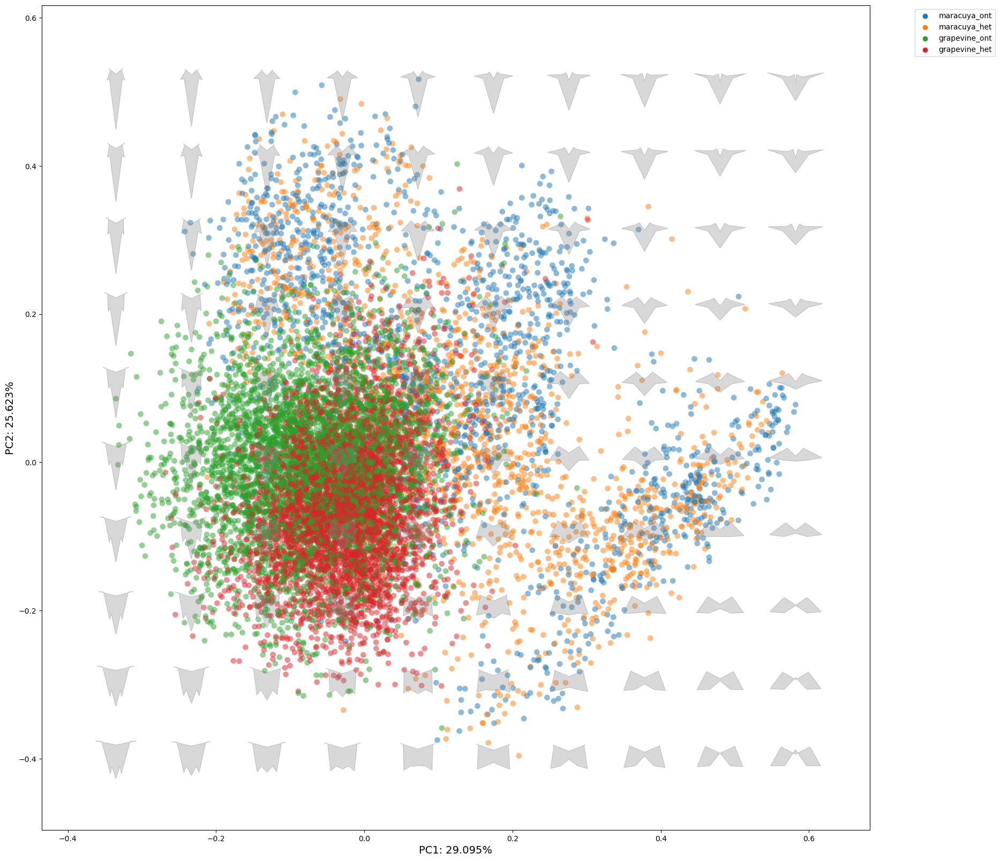

In [17]:
## create df to plot PCs
df = pd.DataFrame({"PC1":PCs[:,0], "PC2":PCs[:,1], "interaction":proc_df["interaction"]})

## scale, determined by checking, to prevent shape overlap
scale = 0.07

## padding on each side of PC to add extra space to see morphospace
PC1_pad = 0.1
PC2_pad = 0.1

## number of intervals to divide each PC axis
num_intervals = 10

## fontsize
fs=14

## point size
ps = 60

## alpha
al = 0.5

plt.figure(figsize=(20,20))

#############
#############
#############

# scatterplot of PC values, colored by interaction class (using hue in seaborn)
sns.scatterplot(data=df, x="PC1", y="PC2", hue="interaction", s=ps, alpha=al, linewidth=0)

# use the morphospace function to create morphospace
Morphospace(scale, PC1_pad, PC2_pad, num_intervals, PCs)

# place the legend outside of the plot
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left") # use loc="upper left" to move

# create axes label with principal component percent variance
plt.xlabel("PC1: "+ str( round(pca.explained_variance_ratio_[0],5)*100 ) + "%", fontsize=14)
plt.ylabel("PC2: "+ str( round(pca.explained_variance_ratio_[1],5)*100 ) + "%", fontsize=14)


# Create a Linear Discriminant Analysis (LDA) by interaction 

In [18]:
# select features for LDA
features = ['xA', 'yA', 'xB', 'yB', 'xC', 'yC', 'xD', 'yD', 'xE', 'yE', 'xF', 'yF', 
            'xG', 'yG', 'xH', 'yH', 'xI','yI', 'xJ', 'yJ', 'xK', 'yK']

In [19]:
# Separating out the features
x = proc_df.loc[:, features].values

# Separating out the target
interaction_y = proc_df.loc[:,['interaction']].values

model = LinearDiscriminantAnalysis()
model.fit(x, interaction_y)

LinearDiscriminantAnalysis()

In [20]:
interact_LDs = model.fit(x, interaction_y).transform(x)

LD_ont_het = np.array(proc_df["ont_het"])
LD_dataset = np.array(proc_df["dataset"])
LD_interaction = np.array(proc_df["interaction"])

LD_df = pd.DataFrame({'LD1':interact_LDs[:,0], 
                      'LD2':interact_LDs[:,1], 
                      'LD3':interact_LDs[:,2],
                      'ont_het':LD_ont_het, 
                      "dataset":LD_dataset, 
                      "interaction":LD_interaction})

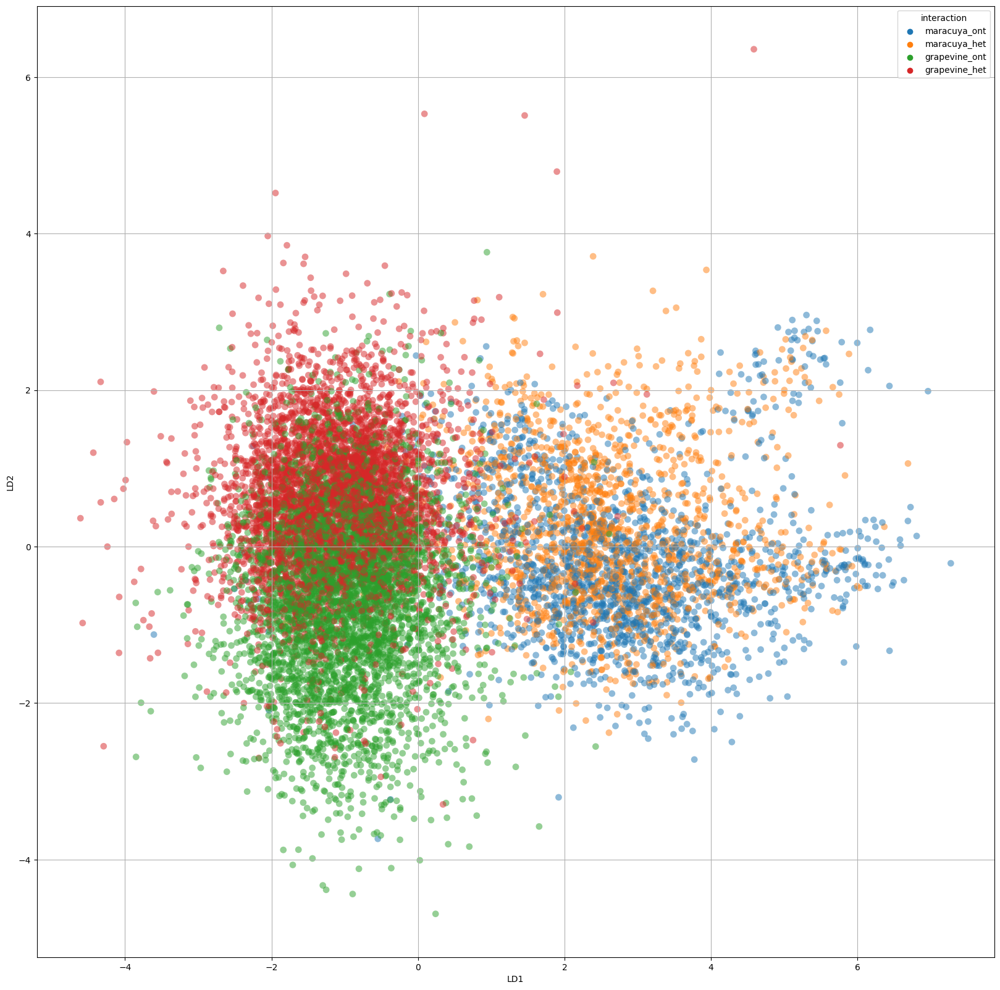

In [21]:
## point size
ps = 60

## alpha
al = 0.5

plt.figure(figsize=(20,20))

sns.scatterplot(data=LD_df, x="LD1", y="LD2", hue="interaction", s=ps, alpha=al, linewidth=0)

plt.grid()



# Plot representative leaves of each class

In [46]:
# mask out data
maracuya_ont = proc_df[proc_df["interaction"]=="maracuya_ont"]
maracuya_het = proc_df[proc_df["interaction"]=="maracuya_het"]
grapevine_ont = proc_df[proc_df["interaction"]=="grapevine_ont"]
grapevine_het = proc_df[proc_df["interaction"]=="grapevine_het"]

# get x and y features for plotting later
x_features = ["xA","xB","xC","xD","xE","xF","xG","xH","xI","xJ","xK"]
y_features = ["yA","yB","yC","yD","yE","yF","yG","yH","yI","yJ","yK"]

# calculate mean leaves for plotting
maracuya_ont_X = maracuya_ont[["xA","xB","xC","xD","xE","xF","xG","xH","xI","xJ","xK"]].mean()
maracuya_ont_Y = maracuya_ont[["yA","yB","yC","yD","yE","yF","yG","yH","yI","yJ","yK"]].mean()

maracuya_het_X = maracuya_het[["xA","xB","xC","xD","xE","xF","xG","xH","xI","xJ","xK"]].mean()
maracuya_het_Y = maracuya_het[["yA","yB","yC","yD","yE","yF","yG","yH","yI","yJ","yK"]].mean()

grapevine_ont_X = grapevine_ont[["xA","xB","xC","xD","xE","xF","xG","xH","xI","xJ","xK"]].mean()
grapevine_ont_Y = grapevine_ont[["yA","yB","yC","yD","yE","yF","yG","yH","yI","yJ","yK"]].mean()

grapevine_het_X = grapevine_het[["xA","xB","xC","xD","xE","xF","xG","xH","xI","xJ","xK"]].mean()
grapevine_het_Y = grapevine_het[["yA","yB","yC","yD","yE","yF","yG","yH","yI","yJ","yK"]].mean()

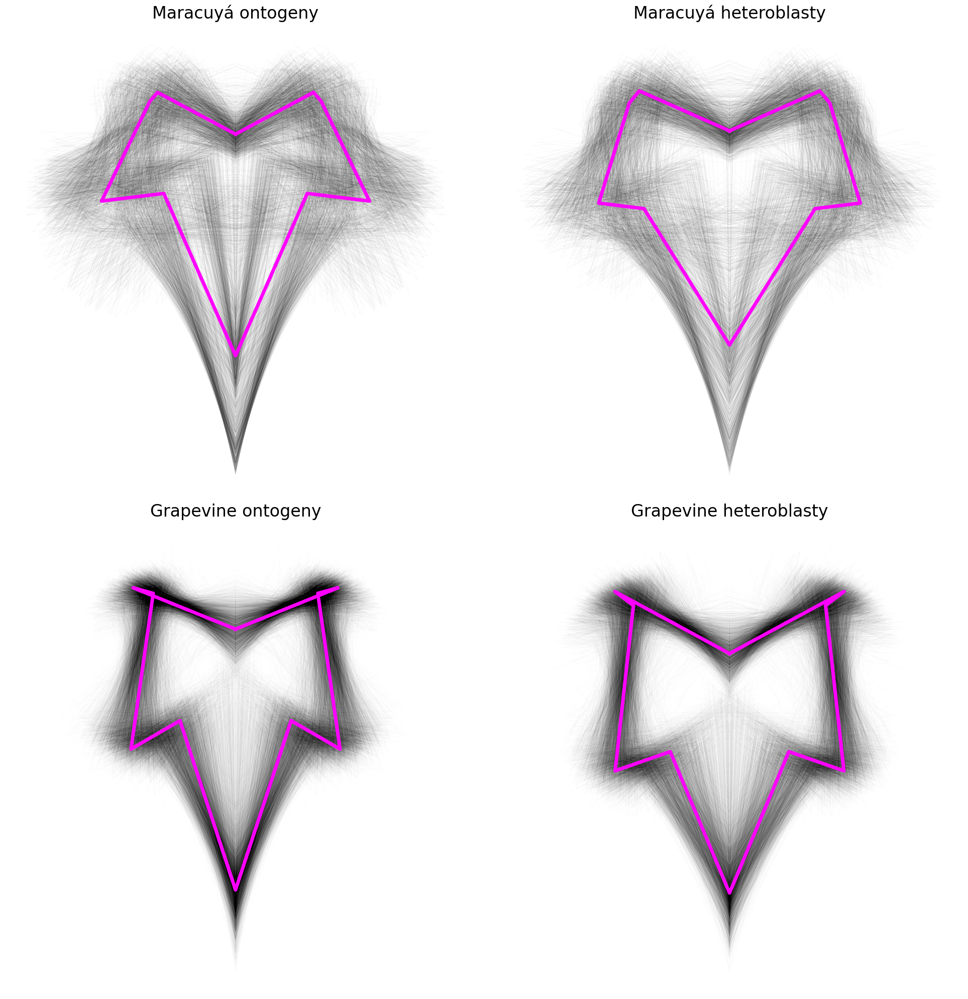

In [49]:
## plot out all Procrustes aligned leaves to check
plot_col = "k" # set plot color
mean_col = "magenta" # set mean leaf color
mean_lw = 5 # set mean leaf lw
maracuya_a = 0.04 # set alpha for maracuya
grapevine_a = 0.015 # set grapevine alpha (x2.6 more than maracuya)
fontsize = 24 # set fontsize
plt.figure(figsize=(20,20))

######################
#### MARACUYA ONT ####
######################

for i in range(len(maracuya_ont)):
    
    curr_leaf = maracuya_ont.iloc[i,:]
    
    plt.subplot(2,2,1)
    ## plot current leaf with color and alpha
    plt.plot(curr_leaf[x_features], curr_leaf[y_features], c=plot_col, alpha=maracuya_a, lw=0.5) 

# plot mean leaf
plt.plot(maracuya_ont_X, maracuya_ont_Y, c=mean_col, lw=mean_lw)
plt.title("Maracuyá ontogeny",  fontsize=fontsize)
plt.gca().set_aspect("equal")
plt.axis("off")

######################
#### MARACUYA HET ####
######################
    
for i in range(len(maracuya_het)):
    
    curr_leaf = maracuya_het.iloc[i,:]
    
    plt.subplot(2,2,2)
    ## plot current leaf with color and alpha
    plt.plot(curr_leaf[x_features], curr_leaf[y_features], c=plot_col, alpha=maracuya_a, lw=0.5) 

# plot mean leaf
plt.plot(maracuya_het_X, maracuya_het_Y, c=mean_col, lw=mean_lw)
plt.title("Maracuyá heteroblasty",  fontsize=fontsize)
plt.gca().set_aspect("equal")
plt.axis("off")

#######################
#### GRAPEVINE ONT ####
#######################

for i in range(len(grapevine_ont)):
    
    curr_leaf = grapevine_ont.iloc[i,:]
    
    plt.subplot(2,2,3)
    ## plot current leaf with color and alpha
    plt.plot(curr_leaf[x_features], curr_leaf[y_features], c=plot_col, alpha=grapevine_a, lw=0.5) 

# plot mean leaf
plt.plot(grapevine_ont_X, grapevine_ont_Y, c=mean_col, lw=mean_lw)
plt.title("Grapevine ontogeny",  fontsize=fontsize)
plt.gca().set_aspect("equal")
plt.axis("off")

#######################
#### GRAPEVINE HET ####
#######################
    
for i in range(len(grapevine_het)):
    
    curr_leaf = grapevine_het.iloc[i,:]
    
    plt.subplot(2,2,4)
    ## plot current leaf with color and alpha
    plt.plot(curr_leaf[x_features], curr_leaf[y_features], c=plot_col, alpha=grapevine_a, lw=0.5) 

# plot mean leaf
plt.plot(grapevine_het_X, grapevine_het_Y, c=mean_col, lw=mean_lw)
plt.title("Grapevine heteroblasty",  fontsize=fontsize)
plt.gca().set_aspect("equal")
plt.axis("off")

plt.tight_layout()